# Hao_PBMC Level 1 ACT annotation result
http://xteam.xbio.top/ACT/ResultAction.action?jobID=202404241701479LIWTT674TKBV6

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import os

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
!ls

ACT_Annotation_L1.txt  Human_Blood plasma.txt query.ipynb
ACT_annotation.ipynb   Human_Blood serum.txt
ACT_marker_genes.ipynb Human_Blood.txt


In [3]:
annot = pd.read_csv('ACT_Annotation_L1.txt', index_col=0, sep='\t')

In [4]:
annot = annot.rename(columns={'whg.overlap': 'canonical.marker.overlap', 'gsea.overlap': 'gsea.DEG.overlap'})
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap
Order,,,,,,,,,
1,B,B cell,5.900029e-16,2.565230e-18,NaN,6/169,8/264,"IGKC,CD74,HLA-DRA,MS4A1,IGHM,CD79A","IGKC,CD74,HLA-DRA,MS4A1,MALAT1,IGHM,B2M,CD79A"
2,B,Plasma cell,6.671106e-15,5.800962e-17,NaN,4/64,5/333,"IGKC,MS4A1,IGHM,CD79A","IGKC,CD74,IGHM,B2M,CD79A"
3,B,Granulocyte,4.627617e-14,6.036022e-16,NaN,6/69,1/40,"IGKC,CD74,HLA-DRA,MS4A1,IGHM,CD79A",HLA-DRA
4,B,Memory B cell,9.384220e-14,1.632038e-15,NaN,5/39,6/44,"S100A4,CD74,HLA-DRA,MS4A1,IGHM","IGKC,CD74,HLA-DRA,MS4A1,IGHM,CD79A"
5,B,Pro-B cell,1.535773e-12,4.006365e-14,NaN,5/17,4/73,"CD74,HLA-DRA,MS4A1,IGHM,CD79A","CD74,HLA-DRA,IGHM,CD79A"
6,B,Macrophage,4.153289e-11,1.264045e-12,NaN,4/281,6/653,"S100A4,CD74,HLA-DRA,B2M","S100A4,CD74,HLA-DRA,ACTB,TMSB4X,B2M"
7,B,Dendritic cell,9.494908e-10,3.715399e-11,NaN,3/143,6/307,"IGKC,CD74,HLA-DRA","S100A4,CD74,HLA-DRA,ACTB,TMSB4X,B2M"
8,B,Monocyte,7.284073e-09,3.166988e-10,NaN,4/218,5/365,"CD74,HLA-DRA,MALAT1,CD79A","S100A4,IGKC,CD74,HLA-DRA,ACTB"
9,B,Plasmacytoid dendritic cell,1.309170e-08,6.261246e-10,NaN,5/93,4/295,"IGKC,CD74,HLA-DRA,MS4A1,CD79A","IGKC,CD74,HLA-DRA,IGHM"


In [ ]:
annot['canonical.marker.overlap'] = annot['canonical.marker.overlap'].str.split(',').fillna('')
annot['gsea.DEG.overlap'] = annot['gsea.DEG.overlap'].str.split(',').fillna('')

In [9]:
annot['union'] = annot.apply(lambda row: list(set(row['canonical.marker.overlap']) | set(row['gsea.DEG.overlap'])), axis=1)
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,B,B cell,5.900029e-16,2.565230e-18,NaN,6/169,8/264,"[IGKC, CD74, HLA-DRA, MS4A1, IGHM, CD79A]","[IGKC, CD74, HLA-DRA, MS4A1, MALAT1, IGHM, B2M...","[IGKC, B2M, MS4A1, CD74, MALAT1, HLA-DRA, CD79..."
2,B,Plasma cell,6.671106e-15,5.800962e-17,NaN,4/64,5/333,"[IGKC, MS4A1, IGHM, CD79A]","[IGKC, CD74, IGHM, B2M, CD79A]","[IGKC, B2M, MS4A1, CD74, CD79A, IGHM]"
3,B,Granulocyte,4.627617e-14,6.036022e-16,NaN,6/69,1/40,"[IGKC, CD74, HLA-DRA, MS4A1, IGHM, CD79A]",[HLA-DRA],"[IGKC, MS4A1, IGHM, CD74, HLA-DRA, CD79A]"
4,B,Memory B cell,9.384220e-14,1.632038e-15,NaN,5/39,6/44,"[S100A4, CD74, HLA-DRA, MS4A1, IGHM]","[IGKC, CD74, HLA-DRA, MS4A1, IGHM, CD79A]","[IGKC, MS4A1, S100A4, CD74, HLA-DRA, CD79A, IGHM]"
5,B,Pro-B cell,1.535773e-12,4.006365e-14,NaN,5/17,4/73,"[CD74, HLA-DRA, MS4A1, IGHM, CD79A]","[CD74, HLA-DRA, IGHM, CD79A]","[MS4A1, CD74, HLA-DRA, CD79A, IGHM]"
6,B,Macrophage,4.153289e-11,1.264045e-12,NaN,4/281,6/653,"[S100A4, CD74, HLA-DRA, B2M]","[S100A4, CD74, HLA-DRA, ACTB, TMSB4X, B2M]","[B2M, TMSB4X, CD74, HLA-DRA, ACTB, S100A4]"
7,B,Dendritic cell,9.494908e-10,3.715399e-11,NaN,3/143,6/307,"[IGKC, CD74, HLA-DRA]","[S100A4, CD74, HLA-DRA, ACTB, TMSB4X, B2M]","[IGKC, B2M, TMSB4X, CD74, HLA-DRA, ACTB, S100A4]"
8,B,Monocyte,7.284073e-09,3.166988e-10,NaN,4/218,5/365,"[CD74, HLA-DRA, MALAT1, CD79A]","[S100A4, IGKC, CD74, HLA-DRA, ACTB]","[IGKC, CD74, MALAT1, HLA-DRA, CD79A, ACTB, S10..."
9,B,Plasmacytoid dendritic cell,1.309170e-08,6.261246e-10,NaN,5/93,4/295,"[IGKC, CD74, HLA-DRA, MS4A1, CD79A]","[IGKC, CD74, HLA-DRA, IGHM]","[IGKC, MS4A1, CD74, HLA-DRA, CD79A, IGHM]"


## Plot UMAP for marker genes (intersection with PreLect)

In [14]:
adata = sc.read_h5ad('/Users/evanli/Documents/Research_datasets/PBMC_Hao/GSE164378_Hao/batch_corrected/Hao_PBMC_Harmony_unscaled.h5ad')
adata.obs['celltype.l1'] = adata.obs['celltype.l1'].str.replace(' ', '_')
labels = adata.obs['celltype.l1']
types = np.unique(labels).tolist()
types

['B', 'CD4_T', 'CD8_T', 'DC', 'Mono', 'NK', 'other', 'other_T']

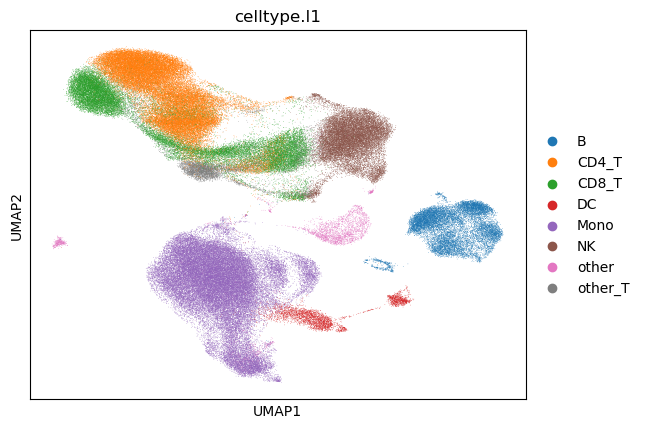

In [17]:
# UMAP embedding in adata
sc.pl.umap(adata, color=['celltype.l1'], legend_loc="right margin")

## B

In [ ]:
# B canonical markers
sc.pl.umap(adata, color=['MS4A1', 'CD79A', 'CD74', 'IGKC', 'IGHM', 'HLA-DRA'])

In [40]:
B_canon = annot[(annot['Cluster']=='B') & (annot['Cell.Type']=='B cell')]['canonical.marker.overlap'].tolist()[0]
B_canon

['IGKC', 'CD74', 'HLA-DRA', 'MS4A1', 'IGHM', 'CD79A']

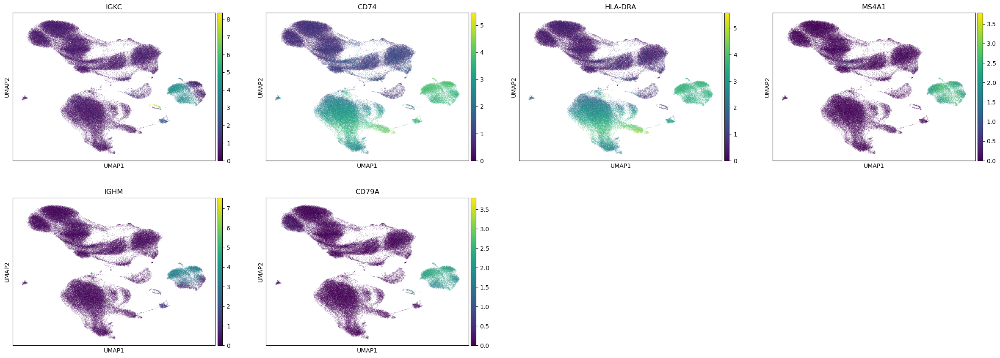

In [41]:
sc.pl.umap(adata, color=B_canon)

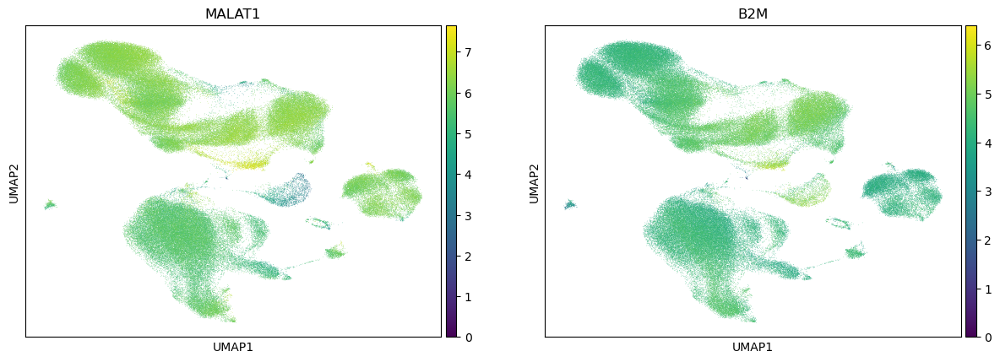

In [22]:
# B DEGs
sc.pl.umap(adata, color=['MALAT1', 'B2M'])

In [42]:
types

['B', 'CD4_T', 'CD8_T', 'DC', 'Mono', 'NK', 'other', 'other_T']

## CD4 T

In [43]:
annot[annot['Cluster']=='CD4_T']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,CD4_T,Mature NK T cell,0.000137,0.000006,NaN,3/39,8/141,"[CD52, CD2, PTPRC]","[SH3BGRL3, CD52, JUN, CD2, TXNIP, CD247, PTPRC...","[CD2, PTPRC, TXNIP, CD52, CD247, SH3BGRL3, CD5..."
2,CD4_T,Memory T cell,0.001008,0.000064,NaN,2/16,6/214,"[S100A4, PTPRC]","[CD52, JUN, CD2, TXNIP, RPS27, PTPRC]","[CD2, PTPRC, TXNIP, CD52, RPS27, S100A4, JUN]"
3,CD4_T,"CD8-positive, alpha-beta cytotoxic T cell",0.020169,0.003004,NaN,2/51,6/175,"[CD2, PTPRC]","[CD52, CD2, TXNIP, RPS27, CD247, PTPRC]","[CD2, PTPRC, TXNIP, CD52, CD247, RPS27]"
4,CD4_T,Effector T cell,0.020169,0.002579,NaN,2/48,1/67,"[JUN, TXNIP]",[CD2],"[CD2, TXNIP, JUN]"


['CD52', 'CD2', 'PTPRC']


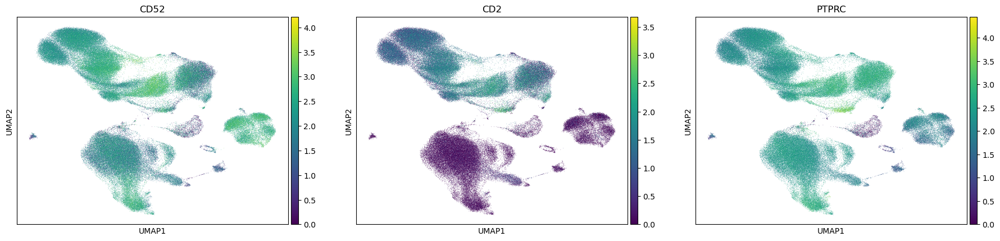

In [46]:
NK_T_canon = annot[(annot['Cluster']=='CD4_T') & (annot['Cell.Type']=='Mature NK T cell')]['canonical.marker.overlap'].tolist()[0]
print(NK_T_canon)
sc.pl.umap(adata, color=NK_T_canon)

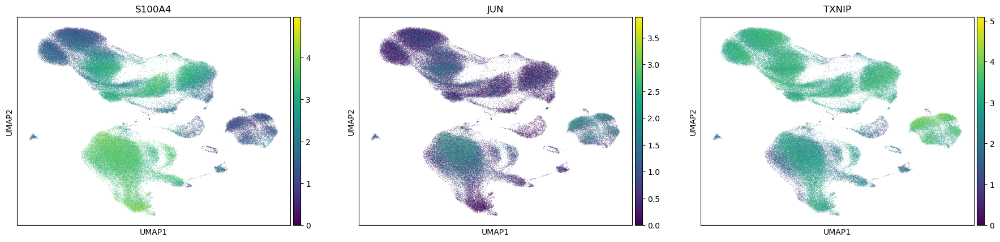

In [48]:
# plot the canonical markers for memory T cells, T_CD8_cytotoxic, and T_effector
T_canon = ['S100A4', 'JUN', 'TXNIP']
sc.pl.umap(adata, color=T_canon)

['SH3BGRL3', 'CD52', 'JUN', 'CD2', 'TXNIP', 'CD247', 'PTPRC', 'CD55']


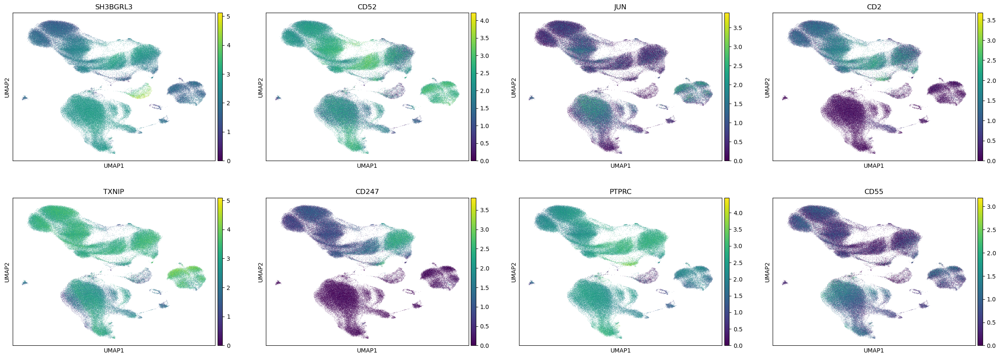

In [50]:
# plot the DEG of NK_T
NK_T_DEG = annot[(annot['Cluster']=='CD4_T') & (annot['Cell.Type']=='Mature NK T cell')]['gsea.DEG.overlap'].tolist()[0]
print(NK_T_DEG)
sc.pl.umap(adata, color=NK_T_DEG)

## CD8 T

In [51]:
annot[annot['Cluster']=='CD8_T']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,CD8_T,"Effector memory CD8-positive, alpha-beta T cell",3.867911e-27,1.645920e-28,NaN,6/44,5/78,"[CD8A, CD8B, CD74, TMSB4X, TRAC, CCL5]","[S100A4, CD8A, CD8B, B2M, CCL5]","[B2M, TMSB4X, S100A4, CD74, CD8A, TRAC, CD8B, ..."
2,CD8_T,T cell,6.588808e-25,4.205622e-26,NaN,8/221,14/225,"[CD8A, CD8B, LTB, ACTB, FTH1, MALAT1, TRAC, CCL5]","[S100A4, CD8A, CD8B, PTMA, ARL4C, LTB, TMSB4X,...","[B2M, TMSB4X, MALAT1, CD3D, ARL4C, PTMA, CD3E,..."
3,CD8_T,"Naive thymus-derived CD8-positive, alpha-beta ...",3.040856e-20,2.587962e-21,NaN,2/13,11/179,"[CD8A, CD8B]","[S100A4, CD8A, CD8B, ARL4C, LTB, ACTB, CD3E, C...","[MT-CO1, S100A4, CD8A, CD3D, ARL4C, CD3E, LTB,..."
4,CD8_T,"CD8-positive, alpha-beta cytotoxic T cell",1.572517e-19,1.672891e-20,NaN,3/51,12/175,"[CD8A, CD8B, CCL5]","[CD8A, CD8B, ARL4C, CD74, LTB, MALAT1, CD3E, C...","[B2M, CD74, CD8A, MALAT1, ARL4C, CD3D, CD3E, L..."
5,CD8_T,"Central memory CD8-positive, alpha-beta T cell",3.620929e-17,4.622462e-18,NaN,2/9,5/40,"[CD8A, CD8B]","[CD8A, CD8B, CD74, B2M, CCL5]","[B2M, CD74, CD8A, CD8B, CCL5]"
6,CD8_T,"Double-positive, alpha-beta thymocyte",9.481429e-17,1.412128e-17,NaN,2/5,0/1,"[CD8A, CD8B]",,"[CD8A, CD8B]"
7,CD8_T,Mature NK T cell,4.236671e-15,7.211354e-16,NaN,3/39,9/141,"[CD8A, CD8B, CCL5]","[ARL4C, LTB, ACTB, MALAT1, CD3E, CD3D, CD3G, T...","[CD8A, MALAT1, CD3D, ARL4C, CD3E, LTB, CD3G, A..."
8,CD8_T,"Effector CD8-positive, alpha-beta T cell",7.265647e-13,1.391294e-13,NaN,2/8,0/1,"[CD8A, CD8B]",,"[CD8A, CD8B]"
9,CD8_T,"CD4-positive, alpha-beta T cell",4.779420e-11,1.118588e-11,NaN,6/93,10/281,"[CD8A, CD8B, LTB, FTH1, TRAC, CCL5]","[S100A4, CD74, LTB, MALAT1, CD3E, CD3D, CD3G, ...","[MALAT1, CD3D, CD3E, TRAC, CD8B, S100A4, CCL5,..."


['CD8A', 'CD8B', 'CD74', 'TMSB4X', 'TRAC', 'CCL5']


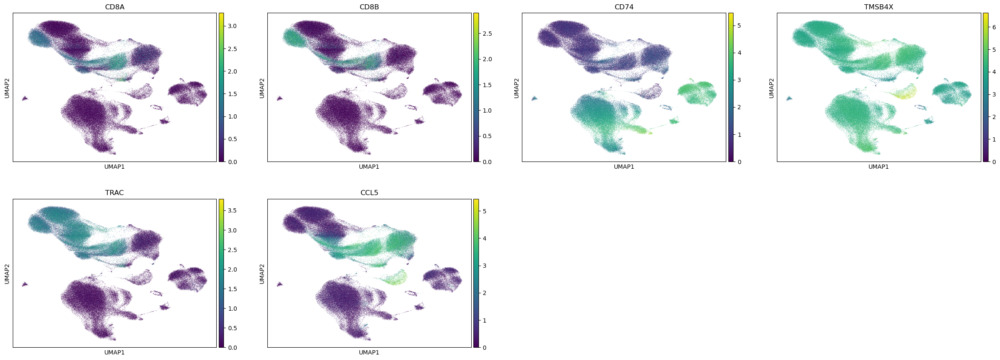

In [54]:
name = 'Effector memory CD8-positive, alpha-beta T cell'
CD8_Tem_canon = annot[(annot['Cluster']=='CD8_T') & (annot['Cell.Type']==name)]['canonical.marker.overlap'].tolist()[0]
print(CD8_Tem_canon)
sc.pl.umap(adata, color=CD8_Tem_canon)

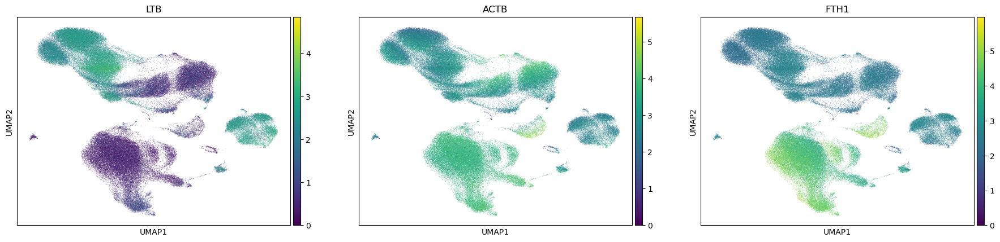

In [56]:
T_canon = ['LTB', 'ACTB', 'FTH1']
sc.pl.umap(adata, color=T_canon)

## DC

In [57]:
annot[annot['Cluster']=='DC']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,DC,Dendritic cell,8.032359e-42,3.492330e-44,NaN,12/143,19/307,"[CD52, FCER1A, PTPRC, CD74, HLA-DRA, HLA-DQA1,...","[CD52, FCER1A, PTPRC, ARL4C, CD74, HLA-C, HLA-...","[HLA-DPA1, HLA-DQA1, PLD4, B2M, TMSB4X, ARL4C,..."
2,DC,Macrophage,1.124414e-23,9.777509e-26,NaN,14/281,22/653,"[CD52, PTPRC, CD74, HLA-DRA, HLA-DQA1, HLA-DPA...","[CD52, TXNIP, FCER1A, PTPRC, CCDC88A, ARL4C, C...","[HLA-DPA1, B2M, TMSB4X, HLA-E, FTL, CD74, HLA-..."
3,DC,Monocyte,6.219952e-21,8.112981e-23,NaN,13/218,16/365,"[CD52, PTPRC, CD74, HLA-DRA, HLA-DQA1, HLA-DPA...","[CD52, TXNIP, PTPRC, ARL4C, CD74, HLA-E, HLA-C...","[HLA-DPA1, HLA-DQA1, HLA-E, MALAT1, TXNIP, ARL..."
4,DC,Conventional dendritic cell,5.057445e-15,1.099445e-16,NaN,5/22,8/99,"[FCER1A, CD74, HLA-DRA, HLA-DPB1, CST3]","[TXNIP, CD74, HLA-DRA, HLA-DQA1, HLA-DPA1, HLA...","[HLA-DPA1, HLA-DQA1, CD74, FCER1A, HLA-DRA, TX..."
5,DC,Myeloid dendritic cell,1.417396e-14,3.697555e-16,NaN,8/63,0/1,"[FCER1A, CD74, HLA-DRA, HLA-DQA1, HLA-DPA1, HL...",,"[HLA-DPA1, HLA-DQA1, PLD4, FCER1A, CD74, HLA-D..."
6,DC,Plasmacytoid dendritic cell,2.994185e-13,9.112736e-15,NaN,8/93,13/295,"[FCER1A, PTPRC, CCDC50, CD74, HLA-DRA, HLA-DPA...","[CCDC88A, ARL4C, CCDC50, CD74, HLA-DRA, HLA-DQ...","[HLA-DPA1, PLD4, HLA-DQA1, ARL4C, CCDC88A, CST..."
7,DC,B cell,1.872234e-12,6.512117e-14,NaN,9/169,14/264,"[PTPRC, CD74, HLA-DRA, HLA-DQA1, HLA-DPA1, HLA...","[CD52, CCDC50, CD74, HLA-E, HLA-C, HLA-DRA, HL...","[HLA-DPA1, HLA-DQA1, B2M, HLA-E, MALAT1, BTG1,..."
8,DC,CD1c-positive myeloid dendritic cell,1.097904e-11,4.773495e-13,NaN,3/15,7/35,"[FCER1A, HLA-DRA, CST3]","[FCER1A, CD74, HLA-DRA, HLA-DQA1, HLA-DPA1, HL...","[HLA-DPA1, HLA-DQA1, FCER1A, CD74, HLA-DRA, HL..."
9,DC,Granulocyte,3.395470e-09,1.771550e-10,NaN,5/69,4/40,"[PTPRC, CD74, HLA-DRA, HLA-DPA1, HLA-DPB1]","[HLA-DRA, SAT1, CST3, FTL]","[HLA-DPA1, FTL, CD74, PTPRC, HLA-DRA, HLA-DPB1..."


['CD52', 'FCER1A', 'PTPRC', 'CD74', 'HLA-DRA', 'HLA-DQA1', 'HLA-DPA1', 'HLA-DPB1', 'TXN', 'PLD4', 'CST3', 'FTL']


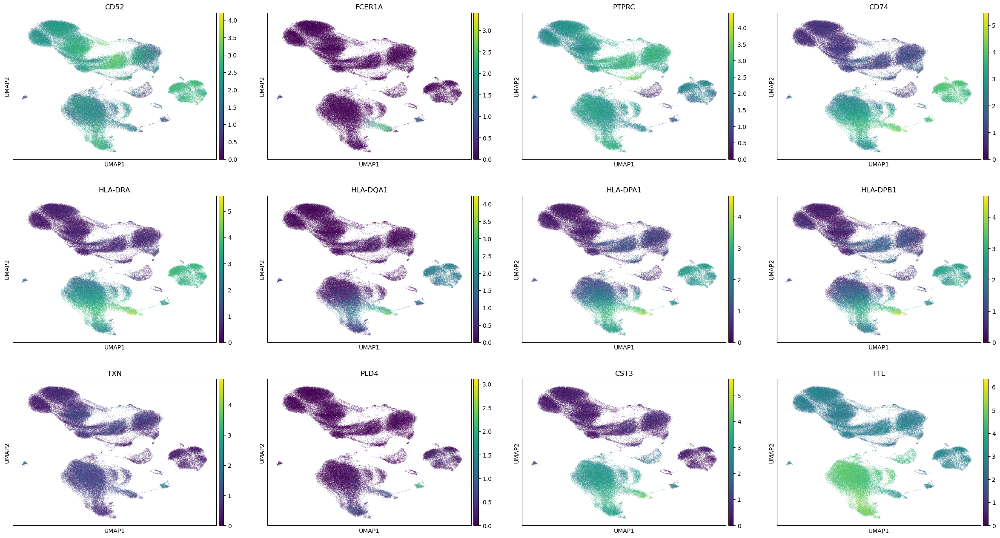

In [58]:
DC_canon = annot[(annot['Cluster']=='DC') & (annot['Cell.Type']=='Dendritic cell')]['canonical.marker.overlap'].tolist()[0]
print(DC_canon)
sc.pl.umap(adata, color=DC_canon)

## Monocyte

In [67]:
annot[annot['Cluster']=='Mono']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Mono,CD14-positive monocyte,9.186073e-25,7.987889e-27,NaN,3/25,8/155,"[S100A9, S100A8, FCN1]","[CTSS, S100A9, S100A8, LST1, AIF1, FCN1, NEAT1...","[FCN1, S100A8, CTSS, LST1, S100A9, AIF1, NEAT1..."
2,Mono,Macrophage,4.087824e-19,5.331945e-21,NaN,12/281,12/653,"[CTSS, S100A9, S100A8, RPS27, LST1, AIF1, SAT1...","[CTSS, S100A9, S100A8, RPS27, LST1, AIF1, SAT1...","[B2M, CTSS, LST1, NEAT1, PSAP, RPS27, CFD, FCN..."
3,Mono,Classical monocyte,2.125735e-17,3.696930e-19,NaN,4/122,4/66,"[S100A9, S100A8, FCN1, NEAT1]","[CTSS, S100A9, S100A8, FCN1]","[FCN1, S100A8, CTSS, NEAT1, S100A9]"
4,Mono,Neutrophil,1.190437e-15,2.587907e-17,NaN,2/117,10/280,"[S100A9, S100A8]","[CTSS, S100A9, S100A8, RPS27, LST1, AIF1, RPS1...","[FCN1, RPS18, S100A8, RPS3, CTSS, LST1, S100A9..."
5,Mono,Suppressor macrophage,2.153486e-15,5.617790e-17,NaN,2/16,0/1,"[S100A9, S100A8]",,"[S100A8, S100A9]"
6,Mono,CD1c-positive myeloid dendritic cell,9.869067e-10,3.861809e-11,NaN,2/15,2/35,"[S100A9, S100A8]","[S100A9, S100A8]","[S100A8, S100A9]"
7,Mono,T cell,6.351484e-08,3.037666e-09,NaN,7/224,6/225,"[S100A9, S100A8, LST1, AIF1, FCN1, MALAT1, PSAP]","[RPS27, AIF1, RPS18, RPS3, RPS29, B2M]","[FCN1, B2M, RPS18, MALAT1, S100A8, RPS3, PSAP,..."
8,Mono,Intermediate monocyte,6.578728e-08,3.432380e-09,NaN,3/21,12/168,"[S100A9, S100A8, FCN1]","[CTSS, S100A9, S100A8, LST1, AIF1, RPS18, SAT1...","[CFD, FCN1, RPS18, S100A8, RPS3, CTSS, LST1, S..."
9,Mono,Inflammatory macrophage,7.412089e-08,4.189442e-09,NaN,4/69,11/421,"[S100A9, S100A8, LST1, FCN1]","[CTSS, S100A9, S100A8, LST1, AIF1, SAT1, FCN1,...","[CFD, FCN1, B2M, S100A8, CTSS, LST1, S100A9, A..."


['S100A9', 'S100A8', 'FCN1', 'NEAT1']


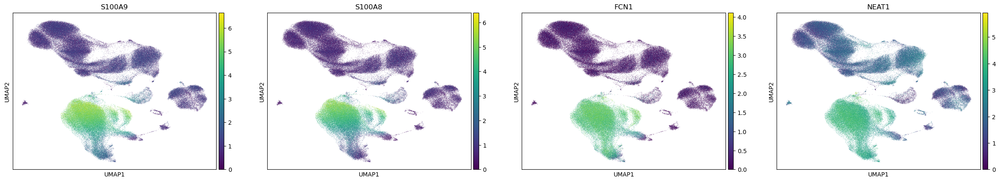

In [68]:
mono_canon = annot[(annot['Cluster']=='Mono') & (annot['Cell.Type']=='Classical monocyte')]['canonical.marker.overlap'].tolist()[0]
print(mono_canon)
sc.pl.umap(adata, color=mono_canon)

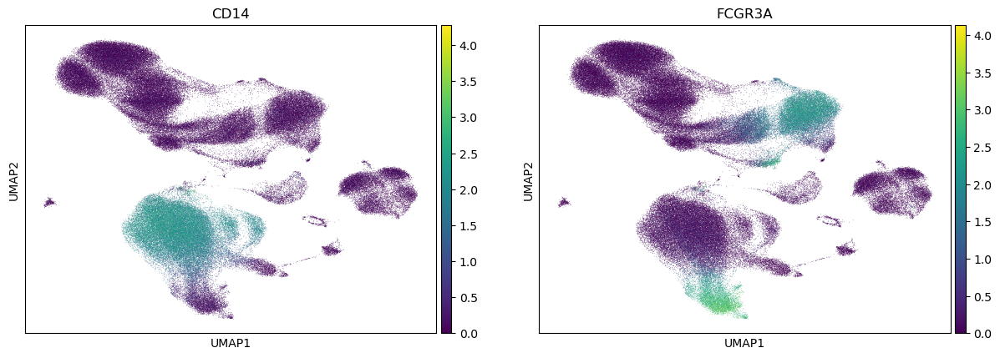

In [75]:
sc.pl.umap(adata, color=['CD14', 'FCGR3A'])
# FCGR3A is CD16

## NK

In [76]:
annot[annot['Cluster']=='NK']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,NK,Natural killer cell,3.481591e-41,1.513735e-43,NaN,15/150,22/223,"[FCER1G, CD247, GNLY, SPON2, CTSW, PRF1, KLRB1...","[CD52, JAK1, S100A4, FCER1G, CD247, GNLY, SPON...","[KLRB1, FCER1G, IL2RB, TMSB4X, GNLY, CD247, S1..."
2,NK,Mature NK T cell,1.588469e-40,1.381277e-42,NaN,12/42,15/141,"[CD52, FCER1G, GNLY, PRF1, KLRB1, KLRF1, KLRD1...","[CD52, CD247, GNLY, HOPX, CLIC3, MALAT1, CTSW,...","[KLRB1, FCER1G, IL2RB, CD7, GNLY, MALAT1, CLIC..."
3,NK,"Effector memory CD8-positive, alpha-beta T cel...",3.110826e-25,4.057599e-27,NaN,6/14,15/167,"[GNLY, HOPX, PRF1, KLRD1, GZMB, NKG7]","[CD52, GNLY, HOPX, RPS12, TMSB4X, RPL39, CTSW,...","[KLRB1, RPL39, B2M, TMSB4X, GNLY, HOPX, NKG7, ..."
4,NK,T cell,2.251949e-22,3.916433e-24,NaN,16/224,18/225,"[CD52, CD247, GNLY, FTH1, MALAT1, VIM, PRF1, K...","[CD52, S100A4, CD247, GNLY, HOPX, RPS12, TMSB4...","[KLRB1, IL2RB, B2M, CD7, GNLY, TMSB4X, MALAT1,..."
5,NK,"CD8-positive, alpha-beta cytotoxic T cell",1.846492e-20,4.014112e-22,NaN,6/54,17/175,"[GNLY, VIM, PRF1, GZMB, CD7, NKG7]","[CD52, JAK1, CD247, GNLY, HOPX, RPS12, MALAT1,...","[KLRB1, B2M, CD7, GNLY, MALAT1, CD247, JAK1, H..."
6,NK,Circulating natural killer cell,4.616530e-19,1.204312e-20,NaN,5/12,14/87,"[GNLY, KLRD1, GZMB, TYROBP, NKG7]","[FCER1G, GNLY, SPON2, HOPX, CLIC3, CTSW, PRF1,...","[SPON2, FCER1G, IL2RB, CD7, GNLY, CLIC3, HOPX,..."
7,NK,Macrophage,3.852330e-13,1.172448e-14,NaN,9/281,11/653,"[CD52, S100A6, S100A4, FCER1G, FTH1, VIM, B2M,...","[CD52, S100A6, S100A4, FCER1G, GNLY, TMSB4X, F...","[FCER1G, B2M, TMSB4X, GNLY, S100A4, S100A6, FT..."
8,NK,Monocyte,4.337649e-13,1.508748e-14,NaN,11/218,11/365,"[CD52, S100A6, FCER1G, GNLY, FTH1, MALAT1, KLR...","[CD52, S100A6, S100A4, FCER1G, GNLY, FTH1, VIM...","[KLRB1, FCER1G, GNLY, MALAT1, S100A4, S100A6, ..."
9,NK,"Effector memory CD8-positive, alpha-beta T cell",1.146640e-10,4.486851e-12,NaN,6/47,13/78,"[GNLY, TMSB4X, PRF1, KLRB1, KLRD1, NKG7]","[CD52, S100A6, S100A4, GNLY, SPON2, RPS12, RPL...","[KLRB1, SPON2, RPL39, B2M, TMSB4X, GNLY, S100A..."


['FCER1G', 'CD247', 'GNLY', 'SPON2', 'CTSW', 'PRF1', 'KLRB1', 'KLRF1', 'KLRD1', 'GZMB', 'IL32', 'CD7', 'TYROBP', 'NKG7', 'IL2RB']


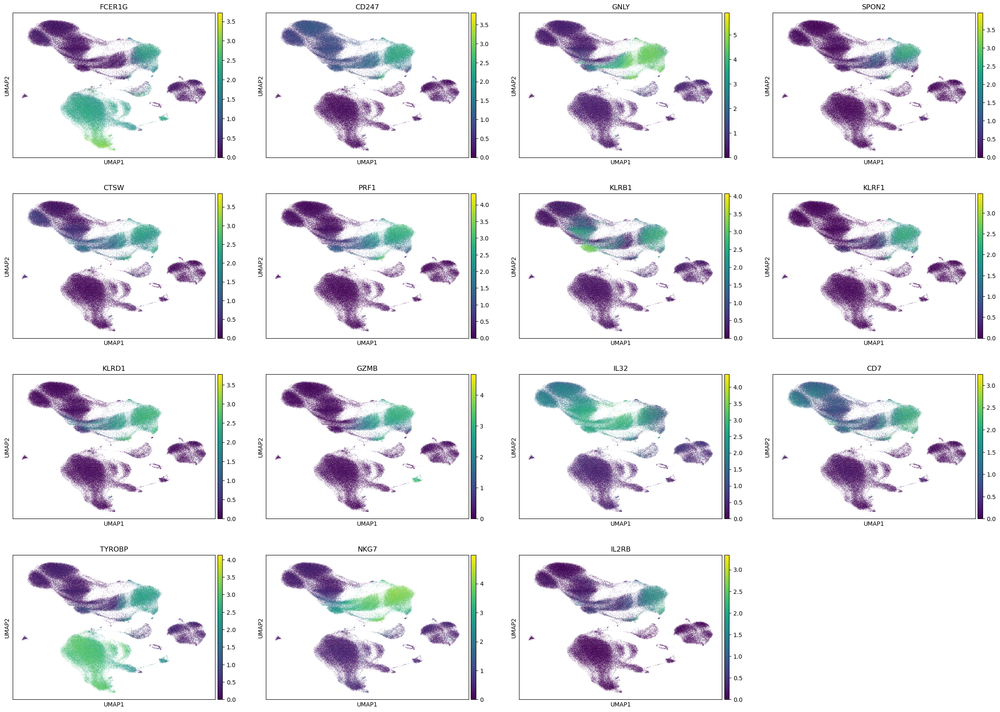

In [77]:
NK_canon = annot[(annot['Cluster']=='NK') & (annot['Cell.Type']=='Natural killer cell')]['canonical.marker.overlap'].tolist()[0]
print(NK_canon)
sc.pl.umap(adata, color=NK_canon)

## other

In [80]:
adata.obs[adata.obs['celltype.l1']=='other']['celltype.l2'].unique()

['Doublet', 'HSPC', 'Platelet', 'Eryth', 'ILC']
Categories (31, object): ['ASDC', 'B intermediate', 'B memory', 'B naive', ..., 'cDC2', 'dnT', 'gdT', 'pDC']

In [81]:
annot[annot['Cluster']=='other']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,other,Megakaryocyte,6.843139e-14,2.975278e-16,NaN,2/69,2/53,"[PPBP, NRGN]","[PPBP, NRGN]","[NRGN, PPBP]"


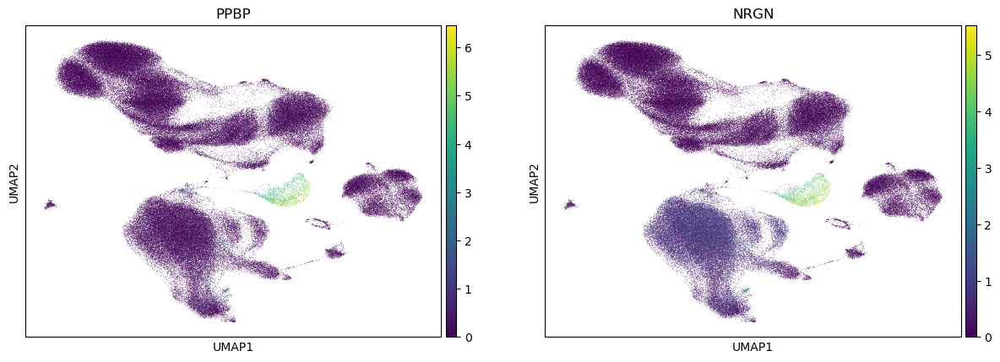

In [82]:
sc.pl.umap(adata, color=['PPBP', 'NRGN'])

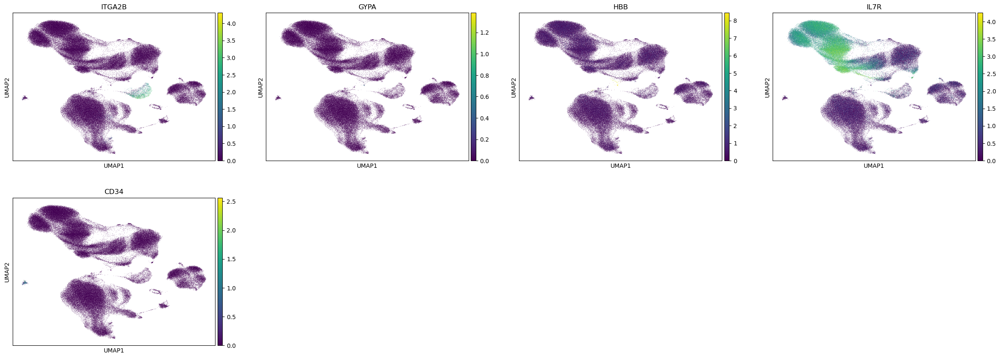

In [84]:
# Platelets marker: 'ITGA2B'
# Erythrocytes marker: 'GYPA', 'HBB'
# ILC marker: 'CD127' (IL7R)
# HSPC (Hematopoietic Stem and Progenitor Cells) marker: 'CD34'
sc.pl.umap(adata, color=['ITGA2B', 'GYPA', 'HBB', 'IL7R', 'CD34'])

## other_T

In [85]:
annot[annot['Cluster']=='other_T']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,other_T,"Effector memory CD8-positive, alpha-beta T cell",9.202864e-20,3.916113e-21,NaN,7/44,3/78,"[PTPRC, CXCR4, IL7R, GZMK, CD74, TRGC2, TMSB4X]","[S100A6, IL7R, GZMK]","[IL7R, TMSB4X, CD74, PTPRC, S100A6, GZMK, CXCR..."
2,other_T,Mature NK T cell,1.774824e-17,1.132867e-18,NaN,6/39,14/141,"[CD2, PTPRC, IL7R, NCR3, TRGC2, TRGC1]","[CD2, TXNIP, PTPRC, DUSP2, CXCR4, ARL4C, CMC1,...","[TXNIP, ARL4C, GZMK, CMC1, LYAR, CXCR4, CD2, N..."
3,other_T,"Central memory CD4-positive, alpha-beta T cell",1.250274e-16,1.064063e-17,NaN,6/25,0/1,"[PTPRC, ZFP36L2, TMSB10, IL7R, CD74, LTB]",,"[LTB, ZFP36L2, TMSB10, IL7R, CD74, PTPRC]"
4,other_T,Memory T cell,4.238117e-15,4.508635e-16,NaN,3/16,14/214,"[PTPRC, IL7R, LTB]","[CD2, TXNIP, RPS27, PTPRC, ZFP36L2, DUSP2, CXC...","[TXNIP, GZMK, LYAR, RPS27, CXCR4, FTH1, CD2, I..."
5,other_T,"CD4-positive, alpha-beta T cell",3.798756e-14,4.849476e-15,NaN,7/93,14/281,"[CD2, PTPRC, IL7R, GZMK, LTB, TRBC1, FTH1]","[CD2, TXNIP, RPS27, PTPRC, ZFP36L2, DUSP2, CXC...","[TXNIP, GZMK, RPS27, FYB1, CXCR4, FTH1, CD2, I..."
6,other_T,"Effector memory CD4-positive, alpha-beta T cell",5.488341e-12,8.174125e-13,NaN,4/26,0/1,"[PTPRC, CXCR4, IL7R, GZMK]",,"[GZMK, PTPRC, CXCR4, IL7R]"
7,other_T,"CD8-positive, alpha-beta T cell",5.851721e-12,9.960377e-13,NaN,7/96,19/293,"[CD2, PTPRC, DUSP2, IL7R, GZMK, LTB, TRBC1]","[JAK1, CD2, PTPRC, ZFP36L2, DUSP2, CXCR4, CMC1...","[TMSB4X, ARL6IP5, GZMK, CMC1, LYAR, CXCR4, JAK..."
8,other_T,Naive T cell,2.018584e-11,3.865374e-12,NaN,2/19,14/192,"[PTPRC, IL7R]","[CD2, TXNIP, S100A11, S100A6, RPS27, ZFP36L2, ...","[TXNIP, ARL4C, RPS27, S100A11, FYB1, CXCR4, S1..."
9,other_T,Effector memory T cell,2.482570e-11,5.282064e-12,NaN,2/3,0/1,"[PTPRC, GZMK]",,"[PTPRC, GZMK]"


In [86]:
adata.obs[adata.obs['celltype.l1']=='other_T']['celltype.l2'].unique()

['MAIT', 'gdT', 'dnT']
Categories (31, object): ['ASDC', 'B intermediate', 'B memory', 'B naive', ..., 'cDC2', 'dnT', 'gdT', 'pDC']

['PTPRC', 'CXCR4', 'IL7R', 'GZMK', 'CD74', 'TRGC2', 'TMSB4X']


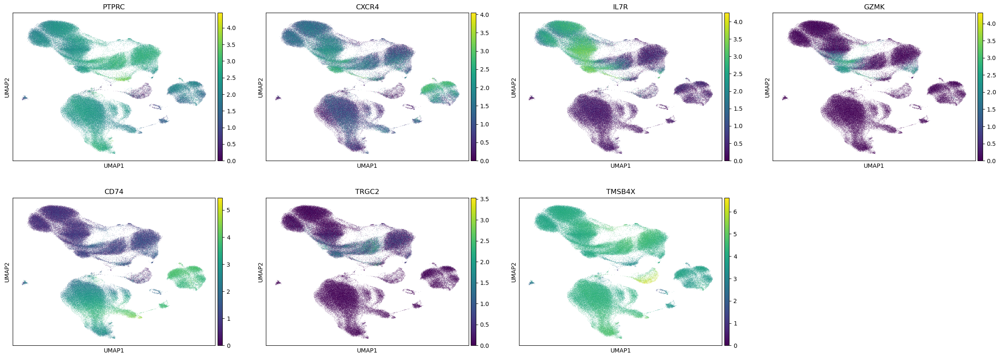

In [87]:
other_T = annot[(annot['Cluster']=='other_T') & (annot['Cell.Type']=='Effector memory CD8-positive, alpha-beta T cell')]['canonical.marker.overlap'].tolist()[0]
print(other_T)
sc.pl.umap(adata, color=other_T)

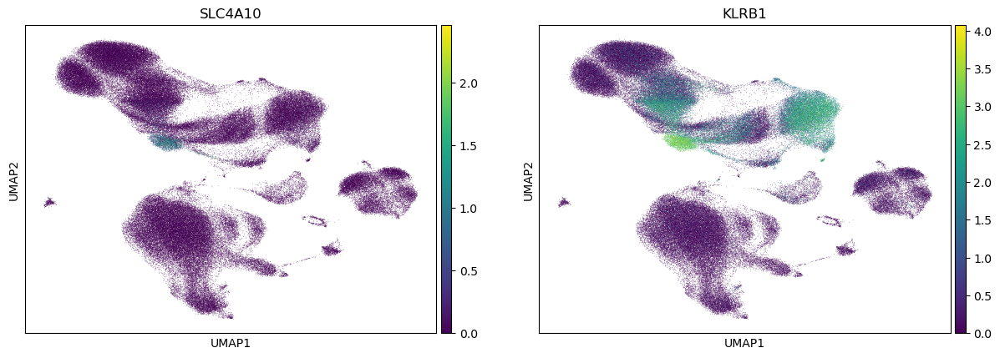

In [90]:
# MAIT markers: SLC4A10, KLRB1, TRAV1-2, CD3D, CD3E, CD3G, CD8A, CXCR4, MAF, ZBTB16
# gdT markers: CD3D, CD3E, TRDC, TRDV2, TRGV9, CD8A, CD8B, TRGC1, TRGC2
mait = ['SLC4A10', 'KLRB1']
# gdt = ['CD3D', 'CD3E', 'TRDC', 'TRDV2', 'TRGV9', 'CD8A', 'CD8B', 'TRGC1', 'TRGC2']
sc.pl.umap(adata, color=mait)